In [1]:
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

from utils import *

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.set_option("display.max_columns", None)

# Daten laden und initial angucken

Als einen ersten Schritt laden wir den neuen Datensatz mit nun allen Windenergieanlagen aus dem Marktstammdatenregister. Dieser liegt vorgefärtigt in einem für Tabellen speziellen Format vor: Parquet. 

Mit dem Ausführen der unteren Zelle lädst die Daten in Pandas ein, wie du es auch schon in der letzten Übung gemacht hast. Zusätzlich führen wir auch gleich `.info()` mit aus, um Informationen zu unseren Spalten zu erhalten.

In [2]:
MaStRWind = pd.read_parquet("MaStRWind.parquet")
MaStRWind.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34142 entries, 0 to 34141
Data columns (total 73 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   EinheitMastrNummer                                  34142 non-null  object        
 1   DatumLetzteAktualisierung                           34142 non-null  datetime64[ns]
 2   LokationMaStRNummer                                 34142 non-null  object        
 3   NetzbetreiberpruefungStatus                         34142 non-null  int64         
 4   NetzbetreiberpruefungDatum                          31852 non-null  datetime64[ns]
 5   AnlagenbetreiberMastrNummer                         34142 non-null  object        
 6   Land                                                34142 non-null  int64         
 7   Bundesland                                          34142 non-null  category      
 8   Landkr

Das sind wirklich verdammt viele Spalten... Ich kann mir unter vielen der Namen nicht einmal vorstellen was da alles hinter stecken soll!

Zum Glück gibt es da eine weitere hilfreiche Funktion in Pandas: `.head(n)`

Hiermit kannst du dir die n ersten Zeilen deiner Tabelle ausgeben lassen, also den Kopf. Logisch, wie englisch "head" auch schon sagt. Wollen wir also die ersten 10 Zeilen sehen, schreiben wir `.head(n=10)`. Wollen wir die ersten 50 Zeilen haben, dann `.head(n=50)`. Das gleich geht auch wenn du dir die letzten Zeilen von unten angucken willst. Dafür kannst du `.tail(n)` benutzen. Willst du also die 10 untersten Zeilen sehen, was bentzt du dann? Probier es aus!

In [3]:
MaStRWind.head(n=5)

,EinheitMastrNummer,DatumLetzteAktualisierung,LokationMaStRNummer,NetzbetreiberpruefungStatus,NetzbetreiberpruefungDatum,AnlagenbetreiberMastrNummer,Land,Bundesland,Landkreis,Gemeinde,Gemeindeschluessel,Postleitzahl,Gemarkung,FlurFlurstuecknummern,StrasseNichtGefunden,Hausnummer_nv,HausnummerNichtGefunden,Ort,Laengengrad,Breitengrad,Registrierungsdatum,Inbetriebnahmedatum,EinheitSystemstatus,EinheitBetriebsstatus,NichtVorhandenInMigriertenEinheiten,NameStromerzeugungseinheit,Weic_nv,Kraftwerksnummer_nv,Energietraeger,Bruttoleistung,Nettonennleistung,AnschlussAnHoechstOderHochSpannung,FernsteuerbarkeitNb,FernsteuerbarkeitDv,FernsteuerbarkeitDr,Einspeisungsart,GenMastrNummer,NameWindpark,Lage,Hersteller,Technologie,Typenbezeichnung,Nabenhoehe,Rotordurchmesser,Rotorblattenteisungssystem,AuflageAbschaltungLeistungsbegrenzung,AuflagenAbschaltungSchallimmissionsschutzNachts,AuflagenAbschaltungSchallimmissionsschutzTagsueber,AuflagenAbschaltungSchattenwurf,AuflagenAbschaltungTierschutz,AuflagenAbschaltungEiswurf,AuflagenAbschaltungSonstige,EegMaStRNummer,Nachtkennzeichnung,Strasse,Hausnummer,GeplantesInbetriebnahmedatum,Adresszusatz,DatumDesBetreiberwechsels,DatumRegistrierungDesBetreiberwechsels,DatumEndgueltigeStilllegung,Weic,WeicDisplayName,Seelage,ClusterNordsee,Wassertiefe,Kuestenentfernung,Buergerenergie,ClusterOstsee,DatumBeginnVoruebergehendeStilllegung,DatumWiederaufnahmeBetrieb,Kraftwerksnummer,Anlagenzahl
0,SEE909551866762,2022-05-18 10:17:34.028350,None,0,NaT,ABR969791194568,84,1416,None,None,NaN,NaN,None,None,0.0,0.0,0.0,None,13.884673,54.831062,2022-05-18,NaT,472,31,0,BE37,0,0,Wind,9525.0,9525.0,NaN,NaN,NaN,NaN,NaN,SGE994933435070,Baltic Eagle,Windkraft auf See,nan,Horizontalläufer,None,107.0,174.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,None,None,2023-12-31,None,NaT,NaT,NaT,None,None,639.0,NaN,NaN,NaN,NaN,1541.0,NaT,NaT,None,1
1,SEE987724164556,2023-02-01 12:02:27.548387,None,0,NaT,ABR935455463257,84,Mecklenburg-Vorpommern,Rostock,Rövershagen,13072088.0,18182.0,None,None,NaN,NaN,NaN,Rövershagen,NaN,NaN,2023-02-01,NaT,472,31,0,Windkraftanlage Europaschule Rövershagen 1,0,0,Wind,3.0,3.0,NaN,0.0,NaN,NaN,689.0,None,None,Windkraft an Land,Aeolos Windkraftanlagen,Vertikalläufer,Aeolos-V 3kW,NaN,2.8,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,None,0.0,None,None,2023-02-28,None,NaT,NaT,NaT,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,None,1
2,SEE955133850360,2020-12-07 12:38:14.911197,SEL939572930425,1,2020-12-16,ABR972167465865,84,Bayern,Aschaffenburg,Hösbach,9671130.0,63768.0,None,None,NaN,NaN,NaN,Hösbach,NaN,NaN,2020-12-07,2015-07-14,472,35,0,Windrad,0,0,Wind,3.0,3.0,NaN,0.0,NaN,NaN,689.0,None,Windrad auf dem Dach,Windkraft an Land,WTT GmbH,Vertikalläufer,WTT2000,NaN,2.4,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,EEG905559550917,NaN,None,None,NaT,None,NaT,NaT,NaT,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,None,1
3,SEE911843552970,2020-12-15 13:32:22.730926,SEL928266921221,1,2021-06-22,ABR993850992970,84,Niedersachsen,Friesland,Varel,3455026.0,26316.0,None,None,NaN,NaN,NaN,Varel,NaN,NaN,2019-08-19,2019-08-19,472,35,0,Windkraft,0,0,Wind,10.0,10.0,NaN,0.0,NaN,NaN,689.0,None,None,Windkraft an Land,Sonstige,Horizontalläufer,EAZ Zwölf,15.0,12.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,EEG965436585340,NaN,None,None,NaT,None,NaT,NaT,NaT,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,None,1
4,SEE976450717662,2019-11-12 11:16:00.803698,SEL932355045910,0,2020-11-13,ABR913853173510,84,Schleswig-Holstein,Nordfriesland,Horstedt,1054052.0,25860.0,None,None,NaN,NaN,NaN,Horstedt,NaN,NaN,2019-11-12,2010-11-11,472,35,0,Weide,0,0,Wind,6.0,6.0,NaN,0.0,NaN,NaN,689.0,None,Weide,Windkraft an Land,Easywind GmbH,Horizontalläufer,Kleinwindkraftanlage,19.0,3.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,EEG909653791177,NaN,None,None,NaT,None,NaT,NaT,NaT,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,None,1


In [4]:
MaStRWind = Datenvorbereitung(MaStRWind)

/home/thartwig/Documents/UBA/GirlsDay_Wind/git/GirlsDay23/utils.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MaStRWind.loc[:,"Inbetriebnahmejahr"] = MaStRWind['Inbetriebnahmedatum'].dt.year
/home/thartwig/Documents/UBA/GirlsDay_Wind/git/GirlsDay23/utils.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MaStRWind.loc[:,"Inbetriebnahmemonat"] = MaStRWind['Inbetriebnahmedatum'].dt.month
/home/thartwig/Documents/UBA/GirlsDay_Wind/git/GirlsDay23/utils.py:9: SettingWithCopyWarning: 
A value is trying to 

# Daten visualisieren und analysieren

Ich weiß ja nicht wie es euch geht, aber ich kann mit so riesen Tabellen immer nicht so gut arbeiten. Mit fällt es immer leichter wenn ich Bilder vor mir habe um Sachen zu erkennen. Falls es euch da ähnlich geht, haben wir in den nächsten Zellen etwas mit dem ihr ein wenig rum probieren könnt. 

### Wochenaktivitäten

Als kleiner Spaß, lasst uns dochmal gucken an welchen Wochentagen eigentlich die meisten Windenergieanlagen je Bundesland in Betrieb genommen werden. 

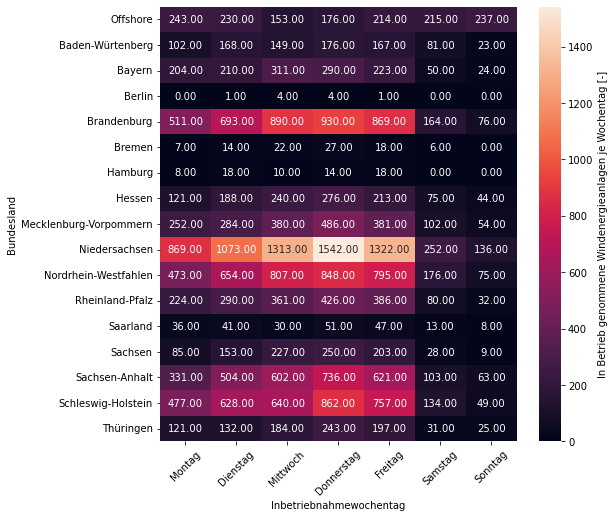

In [5]:
MaStRWind_grouped = MaStRWind.loc[MaStRWind["Inbetriebnahmejahr"]>1990].groupby(by=["Bundesland","Inbetriebnahmewochentag"]).sum()["Anlagenzahl"].reset_index()
#MaStRWind_grouped["Anlagenzahl"] = MaStRWind_grouped["Anlagenzahl"] / 1000000
MaStRWind_grouped_pivot = MaStRWind_grouped.pivot(columns='Inbetriebnahmewochentag',index='Bundesland',values='Anlagenzahl')

wochentage = ["Montag","Dienstag","Mittwoch","Donnerstag","Freitag","Samstag","Sonntag"]

plt.figure(figsize=(8,8))
ax = sns.heatmap(MaStRWind_grouped_pivot, annot=True, fmt=".2f", cbar_kws={'label': 'In Betrieb genommene Windenergieanlagen je Wochentag [-]'})
ax.set_xticklabels(wochentage)
plt.xticks(rotation = 45)
plt.show()

Also am Donnerstag scheint überall am meisten los zu sein. Vielleicht wollen die Leute alle am Freitag nur noch ihre Baustelle aufräumen um dann gut ins Wochenende zu starten? Ich weiß es nicht... Und das warum das so ist, sehen wir das in den Daten? Vielleicht könnt ihr uns hierzu eure Gedanken teilen? Und was ist eigentlich mit den Windenergieanlagen Offshore los?

### Ausbau der Bundesländer seit 1990 

Als nächstes wollen wir uns einmal den Ausbau seit 1990 angucken. Hierfür gucken wir uns wieder alle Bundesländer und den Bereich Offshore einzeln an. Genauer gucken wir uns aber jetzt nicht die reine Anlagenzahl, sonder die installierte Leistung an. Also die Leistung aller in einem Jahr und Bundesland in Betrieb genommenen Windenergianlagen zusammen. Das wird sicher ein ganz schönes Brett an Bild...

<AxesSubplot:xlabel='Inbetriebnahmejahr', ylabel='Bundesland'>

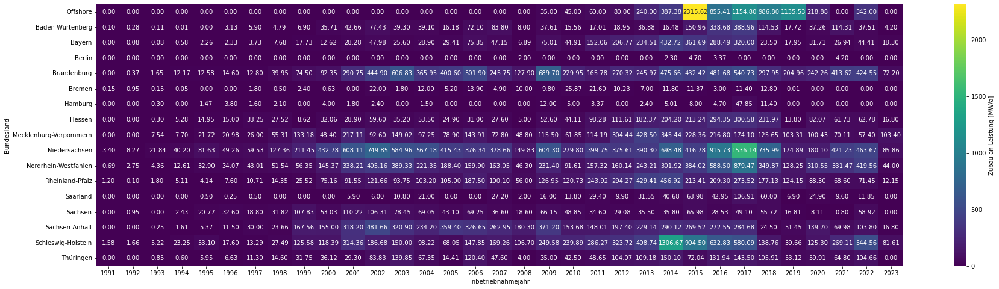

In [6]:
MaStRWind_grouped = MaStRWind.loc[MaStRWind["Inbetriebnahmejahr"]>1990].groupby(by=["Bundesland","Inbetriebnahmejahr"]).sum()["Nettonennleistung"].reset_index()
MaStRWind_grouped["Nettonennleistung"] = MaStRWind_grouped["Nettonennleistung"] / 1000
MaStRWind_grouped_pivot = MaStRWind_grouped.pivot(columns='Inbetriebnahmejahr',index='Bundesland',values='Nettonennleistung')

plt.figure(figsize=(30,8))
sns.heatmap(MaStRWind_grouped_pivot, annot=True, fmt=".2f", cbar_kws={'label': 'Zubau an Leistung [MW/a]'}, cmap="viridis")

Was war denn da ab 2020? Da ging es ja plötzlich gar nicht mehr vorran... Könnt ihr mir vielleicht helfen was dafür der Grund sein könnte?

### Räumliche Zusammenhänge

Jetzt wollen wir dochmal gucken, wie die Windenergieanlagen in Deutschland so verteil sind. Speziell wo große Anlagen stehen und wo kleine. Dafür plotten wir alle uns zur Verfügung stehenden Analgen einmal über ihre Koordinaten, lassen die größe der Punkte von den Rotordurchmessern bestimmt sein und die Farbe nach den Bundesländer. Ich bin mal gespannt wie das so aussieht!

<AxesSubplot:xlabel='Laengengrad', ylabel='Breitengrad'>

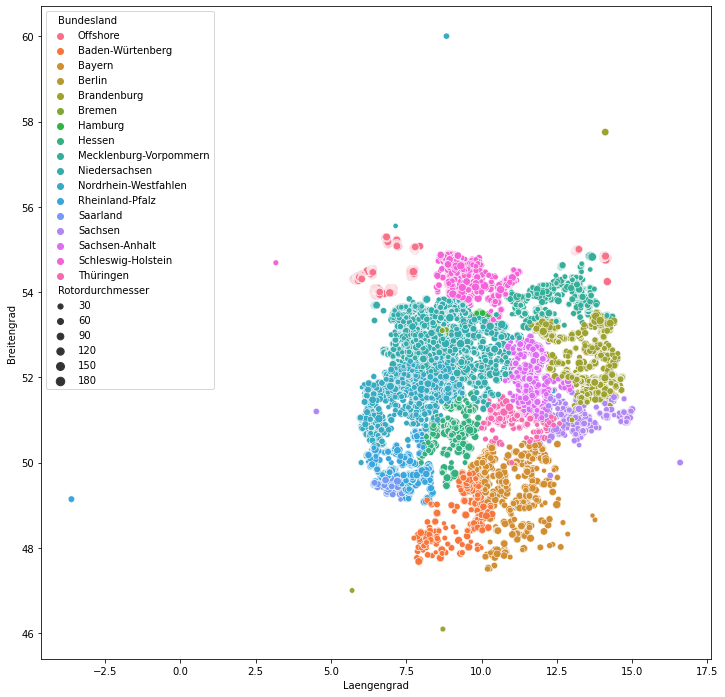

In [7]:
plt.figure(figsize=(12,12))
sns.scatterplot(
    data=MaStRWind.loc[MaStRWind["Inbetriebnahmejahr"]>1990], 
    x="Laengengrad", y="Breitengrad", 
    hue="Bundesland", size="Rotordurchmesser", #style="Bundesland", 
    palette="husl"
)

Huch! Da sind aber einige Anlagen dabei, die garnicht in Deutschland stehen... 

<AxesSubplot:xlabel='Laengengrad', ylabel='Breitengrad'>

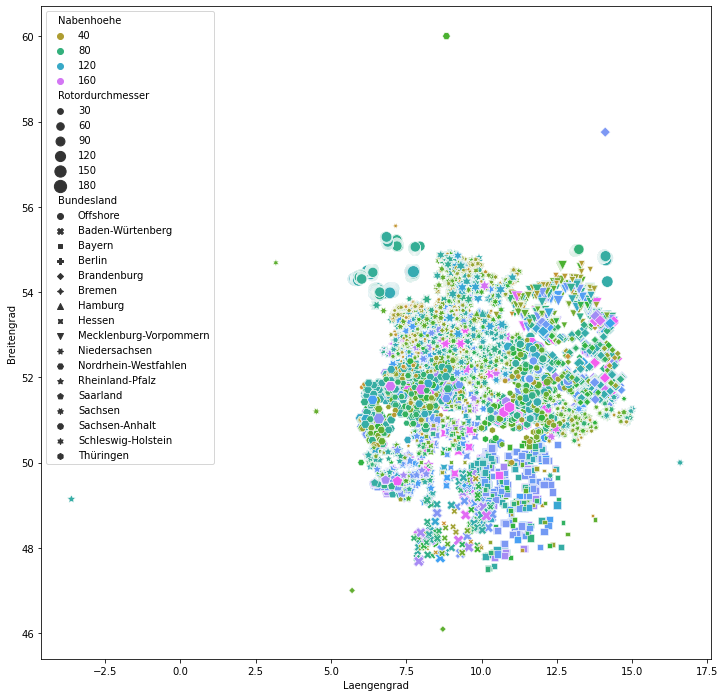

In [8]:
plt.figure(figsize=(12,12))
sns.scatterplot(
    data=MaStRWind.loc[MaStRWind["Inbetriebnahmejahr"]>1990], 
    x="Laengengrad", y="Breitengrad", 
    hue="Nabenhoehe", size="Rotordurchmesser", style="Bundesland", 
    palette="husl", sizes=(10, 150)
)

<AxesSubplot:xlabel='Inbetriebnahmedatum', ylabel='Nabenhoehe'>

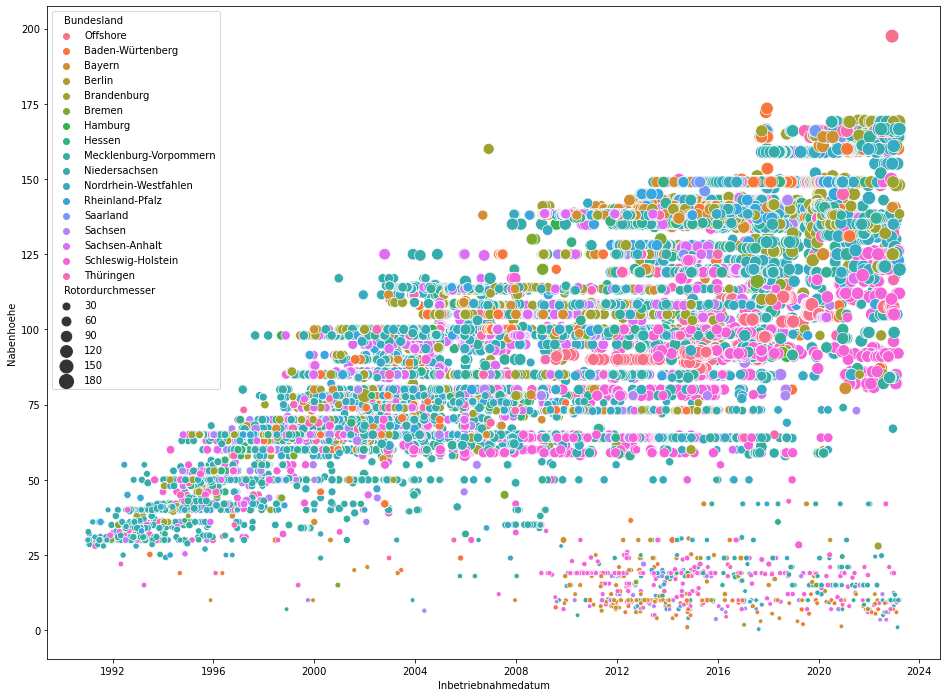

In [9]:
plt.figure(figsize=(16,12))
sns.scatterplot(
    data=MaStRWind.loc[(MaStRWind["Inbetriebnahmejahr"]>1990) & (MaStRWind["Bundesland"]!="Seelage")], 
    x="Inbetriebnahmedatum", y="Nabenhoehe", 
    hue="Bundesland", size="Rotordurchmesser", sizes=(20, 200)
)

In [10]:
MaStRWind_wms = MaStRWind[MaStRWind["Rotordurchmesser"].notna()]
MaStRWind_wms = MaStRWind_wms.loc[MaStRWind_wms["Inbetriebnahmejahr"]>1990]
MaStRWind_wms.sort_values(by=["Inbetriebnahmedatum"], inplace=True)

fig = go.Figure(px.scatter_mapbox(MaStRWind_wms, 
            lat="Breitengrad", 
            lon="Laengengrad", 
            color="Nettonennleistung",
            #size="Rotordurchmesser",
            #size_max=40,
            hover_name="EinheitMastrNummer", 
            hover_data=["Inbetriebnahmedatum","Hersteller","Typenbezeichnung","Nettonennleistung","Nabenhoehe","Rotordurchmesser"],
            color_continuous_scale="jet", 
            zoom=4,
            height=900,
            mapbox_style="open-street-map",
            #animation_frame="Inbetriebnahmejahr",
            )
        )      

fig.update_layout(
    margin = {'l':0, 'r':0, 'b':0, 't':0},
    coloraxis_colorbar=dict(
        title="Nettonennleistung [kW]",
    ),
    title="Windenergieanlagenbestand nach Leistung und Rotordurchmesser",
)

fig.show()